## Introduction


Imagine crafting stunning anime characters not with a pen and paper, but with AI-powered creativity. That’s exactly what we’re doing here! Using Deep Convolutional Generative Adversarial Networks (DCGAN), we’re training a model to generate unique, high-quality anime characters from scratch.

This project blends deep learning, computer vision, and generative modeling to push the boundaries of what AI can create. We leverage PyTorch, TensorFlow, OpenCV, and NumPy to preprocess data, design neural networks, and fine-tune them for hyper-realistic results. The goal? To make AI as creative as human artists!

Whether you’re an AI enthusiast, an anime lover, or someone curious about GANs this project is for you. Buckle up as we take a data-driven approach to creativity and make AI dream in anime!

## Data Preparation

In [1]:
# Install the opencv-python package using pip, which is a library for computer vision tasks
!pip install opencv-python


In [2]:
# Importing necessary libraries

# os is used for interacting with the operating system, like file paths or environment variables
import os 

# OpenCV library for image processing tasks
import cv2

# PyTorch, a deep learning library for building and training neural networks
import torch

# random module to generate random numbers (for tasks like data shuffling)
import random

# warnings is used to control the display of warning messages
import warnings

# NumPy for numerical operations, especially for handling arrays
import numpy as np

# PIL for image loading, manipulation, and saving
from PIL import Image

# PyTorch's neural network module for building models
import torch.nn as nn

# TensorFlow library for machine learning and deep learning, includes Keras as the high-level API
import tensorflow as tf
from tensorflow import keras

# tqdm for progress bars in loops
from tqdm.notebook import tqdm

# PyTorch functional module for functions like ReLU, etc.
import torch.nn.functional as F

# Matplotlib for plotting graphs and visualizing images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# PyTorch’s torchvision transforms for preprocessing images
import torchvision.transforms as T

# Keras layers for building neural network architectures
from tensorflow.keras import layers

# DataLoader for batching data in PyTorch
from torch.utils.data import DataLoader

# Keras backend, providing a common interface for different backends (TensorFlow, Theano, etc.)
from tensorflow.keras import backend as K

# PyTorch ImageFolder dataset utility for loading image datasets
from torchvision.datasets import ImageFolder

# IPython display for showing images within Jupyter Notebooks
from IPython.display import Image as IPImage

# Adam optimizer for training neural networks
from tensorflow.keras.optimizers import Adam

# PyTorch utility for saving and making grid images of data
from torchvision.utils import make_grid, save_image

# Keras loss functions for binary classification (e.g., binary cross-entropy)
from tensorflow.keras.losses import BinaryCrossentropy

# Keras initializers to define the initial state of layers' weights
from tensorflow.keras.initializers import RandomNormal

# Keras Callbacks to help with training, like saving models and monitoring metrics
from tensorflow.keras.callbacks import Callback, ModelCheckpoint

# Keras models for defining architectures and loading pretrained models
from tensorflow.keras.models import Sequential, Model, load_model

# Keras utilities for loading and transforming images
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Various Keras layers, including Convolutional layers and Dense layers for building neural networks
from tensorflow.keras.layers import (Input, Reshape, Dropout, Dense, Flatten,
                                       BatchNormalization, Activation,
                                       LeakyReLU, ReLU, PReLU,
                                       Conv2D, Conv2DTranspose)

# Suppressing warnings that might clutter output during model training and execution
warnings.filterwarnings('ignore')


In [3]:
# store paths of all images
all_images = []
for image in os.listdir("./archive/images"):
    # Construct the full path of the image file
    image_path = os.path.join("./archive/images", image)
    if os.path.isfile(image_path):
        all_images.append(image_path)

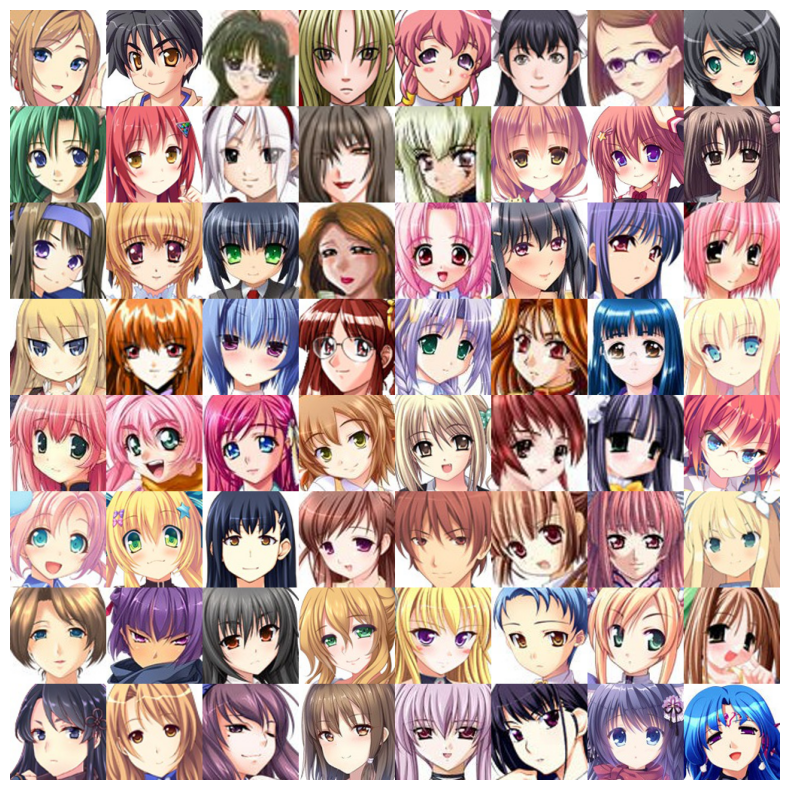

In [4]:
def create_image_grid(images, columns=8):
    """
    Arranges a collection of images into a grid format for visualization.
    """
    num_images, img_height, img_width, channels = images.shape  # Get the shape of the image array
    rows = (num_images + columns - 1) // columns  # Calculate the number of rows, rounding up if needed
    
    # Pad the image array if needed to make a complete grid
    if num_images != rows * columns:
        padding = rows * columns - num_images
        pad_image = np.zeros((img_height, img_width, channels), dtype=images.dtype)  # Create a blank image for padding
        images = np.concatenate([images, np.tile(pad_image, (padding, 1, 1, 1))], axis=0)  # Pad with blank images

    # Reshape and create the grid
    grid = (
        images.reshape(rows, columns, img_height, img_width, channels)  # Reshape into a grid format
        .swapaxes(1, 2)  # Swap axes to align images in the grid correctly
        .reshape(rows * img_height, columns * img_width, channels)  # Flatten the grid into a single array for visualization
    )
    return grid
def select_random_images(image_list, max_images=64, target_size=(128, 128)):
    selected_images = []
    total_images = len(image_list)  # Count of available images
    
    # Limit the selection to the maximum allowed number or fewer if there are not enough images
    image_count = min(total_images, max_images)
    if total_images < max_images:
        print(f"Notice: Only {total_images} images available. Using all available images.")

    for _ in range(image_count):
        chosen_image = random.choice(image_list)  # Randomly pick an image
        img = Image.open(chosen_image).convert('RGB')  # Convert to RGB format
        img = img.resize(target_size)  # Resize image to target dimensions
        selected_images.append(np.asarray(img))  # Append the image array to the list

    return np.array(selected_images)  # Return the array of selected and resized images

# Select random images and create an image grid for visualization
image_array = select_random_images(all_images)
if image_array.size == 0:
    raise ValueError("No images found to display.")

# Generate the grid layout of images
grid_result = create_image_grid(image_array)

# Visualize the image grid using matplotlib
plt.figure(figsize=(10, 10))  # Set the size of the figure
plt.imshow(grid_result)       # Display the grid
plt.axis('off')               # Remove the axis for better visualization
plt.show()                    # Show the final output


Before training, storing the training image data in train_images by converting the previously loaded images into arrays is mandatory. These arrays hold the pixel values of the images, which are crucial for providing the model with the necessary input data during the training phase.

In [5]:
# Load each image from the list of paths, resize them to 64x64 pixels, and convert them to arrays
train_images = [img_to_array(load_img(path, target_size=(64, 64))) for path in all_images]
# Transform the list of image arrays into a NumPy array with a data type of float32
train_images = np.array(train_images, dtype='float32')
# Scale the pixel values to be in the range of -1 to 1 for better model performance
train_images = (train_images - 127.5) / 127.5
# Reshape the train_images array to have a shape of (number of samples, 64, 64, 3)
train_images = train_images.reshape(train_images.shape[0], 64, 64, 3)

In [6]:
# Set up TensorFlow to use the GPU (execute this section only if training on a GPU is intended)
gpus = tf.config.experimental.list_physical_devices('GPU')  # Retrieve a list of all detected GPU devices
if gpus:  # Verify the presence of available GPUs
    try:
        # Limit TensorFlow to using only the first GPU detected
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        print("Using GPU")  # Print confirmation that the GPU is in use
    except RuntimeError as e:
        # Print any errors that occur during GPU configuration
        print(e)

In [7]:
data_dir = "./archive/images"

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,  
    label_mode=None, 
    color_mode='rgb',
    batch_size=128,
    image_size=(64, 64), 
    shuffle=True)

# Normalize images ([-1, 1])
train_ds = train_ds.map(lambda x: (x / 127.5) - 1)

Found 63565 files.


## Defining Generator & Discriminator

In [8]:
# Weights initializer
init = tf.keras.initializers.RandomNormal(stddev=0.02)

In [9]:
def build_generator(input_size):
    """
    Constructs the generator network for the GAN.
    
    Parameters:
        input_size: The dimension of the input random vector for the generator.
    
    Returns:
        generator_model: A Keras model representing the generator architecture.
    """
    initializer = RandomNormal(mean=0.0, stddev=0.02)  # Set the kernel initializer
    
    # Initialize a sequential model for the generator
    generator_model = Sequential()  
    
    # Block 1: Initial dense layer expanding the seed vector into a higher-dimensional space
    generator_model.add(Dense(4 * 4 * 1024, kernel_initializer=initializer, input_dim=input_size))  # Create initial feature set
    generator_model.add(BatchNormalization())  # Apply batch normalization for training stability
    generator_model.add(ReLU())  # Add ReLU activation function
    generator_model.add(Reshape((4, 4, 1024)))  # Reshape the output to (4, 4, 1024) for convolutional processing

    # Block 2: Upsampling the feature map using transposed convolution
    generator_model.add(Conv2DTranspose(512, kernel_size=5, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (8, 8, 512)
    generator_model.add(BatchNormalization())  # Normalize the output
    generator_model.add(ReLU())  # Apply ReLU activation

    # Block 3: Further increase in resolution
    generator_model.add(Conv2DTranspose(256, kernel_size=5, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (16, 16, 256)
    generator_model.add(BatchNormalization())  # Normalize the output
    generator_model.add(ReLU())  # Add ReLU activation

    # Block 4: Continuing the upsampling process
    generator_model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (32, 32, 128)
    generator_model.add(BatchNormalization())  # Normalize the output
    generator_model.add(ReLU())  # Add ReLU activation

    # Block 5: Final layer for generating the output image
    generator_model.add(Conv2DTranspose(3, kernel_size=3, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (64, 64, 3)
    generator_model.add(Activation('tanh'))  # Use tanh to scale output pixel values between [-1, 1]

    return generator_model  # Return the constructed generator model

# Instantiate the generator model and display its architecture
seed_dimension = 100  # Define the size of the input seed
generator_model = build_generator(seed_dimension)  # Build the generator model
generator_model.summary()  # Print the summary of the generator model

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16384)          │     1,654,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16384)          │        65,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 8, 8, 512)      │    13,107,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 16, 16, 256)    │     3,276,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 32, 32, 128)    │       294,912 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 64, 64, 3)      │         3,456 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 64, 64, 3)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,406,272 (70.21 MB)

 Trainable params: 18,371,712 (70.08 MB)

 Non-trainable params: 34,560 (135.00 KB)

In [10]:
def create_discriminator(img_size, num_channels):
    """
    Constructs the discriminator model for a GAN.

    Parameters:
        img_size: Length of one side of the square input image.
        num_channels: The number of channels in the input image.

    Returns:
        model: A Keras model instance representing the discriminator.
    """
    initializer = RandomNormal(mean=0.0, stddev=0.02)  # Initialize the weights of the layers

    model = Sequential()  # Create an empty sequential model

    # Block - 1: Initial convolution layer to extract features from the input image
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same', use_bias=False, 
                     input_shape=(img_size, img_size, num_channels), 
                     kernel_initializer=initializer))
    model.add(LeakyReLU(alpha=0.2))  # LeakyReLU activation for gradient flow
    # Shape after this block = (img_size / 2, img_size / 2, 64)

    # Block - 2: Second convolutional layer for additional feature extraction
    model.add(Conv2D(128, kernel_size=3, strides=2, padding='same', use_bias=False, 
                     kernel_initializer=initializer))
    model.add(BatchNormalization())  # Batch normalization for stabilizing training
    model.add(LeakyReLU(alpha=0.2))  # LeakyReLU activation
    # Shape after this block = (img_size / 4, img_size / 4, 128)

    # Block - 3: Third convolutional layer using a larger kernel
    model.add(Conv2D(256, kernel_size=5, strides=2, padding='same', use_bias=False, 
                     kernel_initializer=initializer))
    model.add(BatchNormalization())  # Batch normalization
    model.add(LeakyReLU(alpha=0.2))  # LeakyReLU activation
    # Shape after this block = (img_size / 8, img_size / 8, 256)

    # Block - 4: Fourth convolutional layer for deeper feature extraction
    model.add(Conv2D(512, kernel_size=5, strides=2, padding='same', use_bias=False, 
                     kernel_initializer=initializer))
    model.add(BatchNormalization())  # Batch normalization
    model.add(LeakyReLU(alpha=0.2))  # LeakyReLU activation
    # Shape after this block = (img_size / 16, img_size / 16, 512)

    # Block - 5: Final convolutional layer to output a probability score
    model.add(Conv2D(1, kernel_size=4, strides=1, padding='valid', use_bias=False, 
                     kernel_initializer=initializer))  # Output layer
    model.add(Flatten())  # Flatten the output for the final decision
    model.add(Activation('sigmoid'))  # Sigmoid activation to produce a probability value

    return model  # Return the constructed discriminator model

# Instantiate the discriminator and display its architecture
img_size = 64  # Example size for square images
num_channels = 3  # Example for RGB images
discriminator = create_discriminator(img_size, num_channels)
discriminator.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 256)      │       819,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 512)      │     3,276,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 4, 4, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 1, 1, 1)        │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 1)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,183,232 (15.96 MB)

 Trainable params: 4,181,440 (15.95 MB)

 Non-trainable params: 1,792 (7.00 KB)

## Defining & Testing CGGAN

In this segment, we establish a DCGAN architecture by extending the Keras Model class. This framework incorporates functionalities for calculating the losses of both the generator and discriminator, in addition to implementing a specialized training procedure.

In [11]:
from tensorflow.keras import models, layers, Sequential
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.losses import BinaryCrossentropy

# Define cross entropy loss function
cross_entropy_loss = BinaryCrossentropy()

def create_discriminator(img_size, num_channels):
    """
    Constructs the discriminator model for a GAN.

    Parameters:
        img_size: Length of one side of the square input image.
        num_channels: The number of channels in the input image.

    Returns:
        model: A Keras model instance representing the discriminator.
    """
    initializer = RandomNormal(mean=0.0, stddev=0.02)  # Initialize the weights of the layers

    model = Sequential()  # Create an empty sequential model

    # Block - 1: Initial convolution layer to extract features from the input image
    model.add(layers.Conv2D(64, kernel_size=3, strides=2, padding='same', use_bias=False, 
                             input_shape=(img_size, img_size, num_channels), 
                             kernel_initializer=initializer))
    model.add(layers.LeakyReLU(alpha=0.2))  # LeakyReLU activation for gradient flow

    # Block - 2: Second convolutional layer for additional feature extraction
    model.add(layers.Conv2D(128, kernel_size=3, strides=2, padding='same', use_bias=False, 
                             kernel_initializer=initializer))
    model.add(layers.BatchNormalization())  # Batch normalization for stabilizing training
    model.add(layers.LeakyReLU(alpha=0.2))  # LeakyReLU activation

    # Block - 3: Third convolutional layer using a larger kernel
    model.add(layers.Conv2D(256, kernel_size=5, strides=2, padding='same', use_bias=False, 
                             kernel_initializer=initializer))
    model.add(layers.BatchNormalization())  # Batch normalization
    model.add(layers.LeakyReLU(alpha=0.2))  # LeakyReLU activation

    # Block - 4: Fourth convolutional layer for deeper feature extraction
    model.add(layers.Conv2D(512, kernel_size=5, strides=2, padding='same', use_bias=False, 
                             kernel_initializer=initializer))
    model.add(layers.BatchNormalization())  # Batch normalization
    model.add(layers.LeakyReLU(alpha=0.2))  # LeakyReLU activation

    # Block - 5: Final convolutional layer to output a probability score
    model.add(layers.Conv2D(1, kernel_size=4, strides=1, padding='valid', use_bias=False, 
                             kernel_initializer=initializer))  # Output layer
    model.add(layers.Flatten())  # Flatten the output for the final decision
    model.add(layers.Activation('sigmoid'))  # Sigmoid activation to produce a probability value

    return model  # Return the constructed discriminator model

def build_generator(input_size):
    """
    Constructs the generator network for the GAN.
    
    Parameters:
        input_size: The dimension of the input random vector for the generator.
    
    Returns:
        generator_model: A Keras model representing the generator architecture.
    """
    initializer = RandomNormal(mean=0.0, stddev=0.02)  # Set the kernel initializer
    
    # Initialize a sequential model for the generator
    generator_model = Sequential()  
    
    # Block 1: Initial dense layer expanding the seed vector into a higher-dimensional space
    generator_model.add(layers.Dense(4 * 4 * 1024, kernel_initializer=initializer, input_dim=input_size))  # Create initial feature set
    generator_model.add(layers.BatchNormalization())  # Apply batch normalization for training stability
    generator_model.add(layers.ReLU())  # Add ReLU activation function
    generator_model.add(layers.Reshape((4, 4, 1024)))  # Reshape the output to (4, 4, 1024) for convolutional processing

    # Block 2: Upsampling the feature map using transposed convolution
    generator_model.add(layers.Conv2DTranspose(512, kernel_size=5, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (8, 8, 512)
    generator_model.add(layers.BatchNormalization())  # Normalize the output
    generator_model.add(layers.ReLU())  # Apply ReLU activation

    # Block 3: Further increase in resolution
    generator_model.add(layers.Conv2DTranspose(256, kernel_size=5, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (16, 16, 256)
    generator_model.add(layers.BatchNormalization())  # Normalize the output
    generator_model.add(layers.ReLU())  # Add ReLU activation

    # Block 4: Continuing the upsampling process
    generator_model.add(layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (32, 32, 128)
    generator_model.add(layers.BatchNormalization())  # Normalize the output
    generator_model.add(layers.ReLU())  # Add ReLU activation

    # Block 5: Final layer for generating the output image
    generator_model.add(layers.Conv2DTranspose(3, kernel_size=3, strides=2, padding='same', use_bias=False, kernel_initializer=initializer))  # Upscale to (64, 64, 3)
    generator_model.add(layers.Activation('tanh'))  # Use tanh to scale output pixel values between [-1, 1]

    return generator_model  # Return the constructed generator model

class DCGANModel(tf.keras.Model):
    """A custom subclass of keras.Model that implements a unique training routine and calculates loss metrics."""
    
    def __init__(self, random_vector_size, img_dimension, img_channels, **kwargs):
        """
        Args:
            random_vector_size: Dimension of the noise vector used by the generator.
            img_dimension: Length of each side of the square input image.
            img_channels: The number of color channels in the image.
        """
        super(DCGANModel, self).__init__(**kwargs)

        # Create the generator and discriminator components
        self.generator = build_generator(random_vector_size)
        self.discriminator = create_discriminator(img_dimension, img_channels)
        self.random_vector_size = random_vector_size
        
    # Calculate the generator's loss
    def compute_generator_loss(self, discriminator_output):
        """
        Args:
            discriminator_output: Predictions from the discriminator for generated images.
        
        Returns:
            The computed loss value based on the discriminator's evaluation.
        """
        return cross_entropy_loss(tf.ones_like(discriminator_output), discriminator_output)

    def compute_discriminator_loss(self, real_predictions, fake_predictions, label_smoothing=0.1):
        """
        Args:
            real_predictions: Discriminator's output for real images.
            fake_predictions: Discriminator's output for images generated by the generator.
        
        Returns:
            The total loss computed for the discriminator.
        """
        real_loss_value = cross_entropy_loss(tf.ones_like(real_predictions) * (1 - label_smoothing), real_predictions)
        fake_loss_value = cross_entropy_loss(tf.zeros_like(fake_predictions), fake_predictions)
        return real_loss_value + fake_loss_value
    
    def compile_model(self, generator_optimizer, discriminator_optimizer):
        """
        Prepares the model for training by defining the optimizers.
        
        Args:
            generator_optimizer: Optimizer configured for the generator.
            discriminator_optimizer: Optimizer configured for the discriminator.
        """
        super(DCGANModel, self).compile()
        self.gen_optimizer = generator_optimizer
        self.disc_optimizer = discriminator_optimizer
        
    @tf.function    
    def train_step(self, input_data):
        """
        Executes one training step using a given batch of data.
        
        Args:
            input_data: A batch sampled from the training dataset.
        
        Returns:
            A dictionary containing the losses for both generator and discriminator.
        """
        batch_size = tf.shape(input_data)[0]
        
        random_seed = tf.random.normal(shape=(batch_size, self.random_vector_size))
        
        with tf.GradientTape() as generator_tape, tf.GradientTape() as discriminator_tape:
            generated_image = self.generator(random_seed, training=True)
        
            real_predictions = self.discriminator(input_data, training=True)
            fake_predictions = self.discriminator(generated_image, training=True) 
            
            generator_loss_value = self.compute_generator_loss(fake_predictions)
            discriminator_loss_value = self.compute_discriminator_loss(real_predictions, fake_predictions)

            generator_gradients = generator_tape.gradient(generator_loss_value, self.generator.trainable_variables)
            discriminator_gradients = discriminator_tape.gradient(discriminator_loss_value, self.discriminator.trainable_variables)

            self.gen_optimizer.apply_gradients(zip(generator_gradients, self.generator.trainable_variables))
            self.disc_optimizer.apply_gradients(zip(discriminator_gradients, self.discriminator.trainable_variables))
        
        return {
            "gen_loss": generator_loss_value,
            "disc_loss": discriminator_loss_value
        }

# Define model parameters
img_dimension = 64  # Example image size (64x64)
img_channels = 3    # Example number of channels (RGB)
random_vector_size = 100  # Size of the random input vector
batch_size = 128    # Size of each training batch

# Instantiate and compile the model
dcgan = DCGANModel(random_vector_size, img_dimension, img_channels)
generator_optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
dcgan.compile_model(generator_optimizer, discriminator_optimizer)

In [12]:
# Define constants for grid layout
NUM_ROWS = 4  # Number of rows for the image grid
NUM_COLS = 7  # Number of columns for the image grid
MARGIN = 0.5  # Margin for spacing between images in the grid

# Fixed seed for consistent image generation across epochs
fixed_seed = tf.random.normal(shape=(NUM_ROWS * NUM_COLS, random_vector_size))

class SaveImages(tf.keras.callbacks.Callback):
    def __init__(self, generator, noise, num_rows, num_cols, margin):
        super(SaveImages, self).__init__()  # Properly call the parent constructor
        self.generator = generator
        self.noise = noise
        self.num_rows = num_rows
        self.num_cols = num_cols
        self.margin = margin

    def on_epoch_end(self, epoch, logs=None):
        # Generate images at the end of each epoch
        generated_images = self.generator(self.noise, training=False)
        generated_images = (generated_images + 1) / 2.0  # Rescale to [0, 1]
        
        # Plot images in a grid with custom aesthetics
        fig, ax = plt.subplots(self.num_rows, self.num_cols, figsize=(self.num_cols * 2, self.num_rows * 2))
        fig.patch.set_facecolor('#fefefe')  # Set figure background color
        
        for i in range(self.num_rows):
            for j in range(self.num_cols):
                ax[i, j].imshow(generated_images[i * self.num_cols + j])
                ax[i, j].axis('off')  # Hide axes
                
                # Add a border around each image
                for spine in ax[i, j].spines.values():
                    spine.set_visible(True)
                    spine.set_linewidth(2)
                    spine.set_color('#b56576' if (i + j) % 2 == 0 else '#e56b6f')  # Alternate border colors
        plt.subplots_adjust(wspace=self.margin, hspace=self.margin)
        plt.savefig(f"generated_image_epoch_{epoch + 1}.png", bbox_inches='tight', dpi=300)
        plt.close()

# Checkpoint callback to save model weights
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath="model_checkpoint.weights.h5",  # Use the correct file extension for saving weights
    save_weights_only=True,  # Save only the weights
    save_best_only=True,  # Save only the best model according to the monitored metric
    verbose=1)
# Fixed seed for consistent image generation across epochs
fixed_seed = tf.random.normal(shape=(NUM_ROWS * NUM_COLS, random_vector_size))
# Use SaveImages callback
save_images_callback = SaveImages(dcgan.generator, fixed_seed, NUM_ROWS, NUM_COLS, MARGIN)
# Training the DCGAN model
with tf.device('/GPU:0'):
    history = dcgan.fit(
        train_ds, 
        epochs=80, 
        batch_size=batch_size,
        callbacks=[
            save_images_callback,  # Use the instantiated callback
            checkpoint_callback  # Use the instantiated checkpoint callback
        ])

Epoch 1/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 955s 2s/step - disc_loss: 1.1746 - gen_loss: 3.5972
Epoch 2/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 897s 2s/step - disc_loss: 1.0391 - gen_loss: 2.0504
Epoch 3/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 891s 2s/step - disc_loss: 0.9727 - gen_loss: 2.0282
Epoch 4/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 873s 2s/step - disc_loss: 0.8395 - gen_loss: 2.2831
Epoch 5/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 871s 2s/step - disc_loss: 0.8371 - gen_loss: 2.4142
Epoch 6/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 874s 2s/step - disc_loss: 0.8113 - gen_loss: 2.4784
Epoch 7/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 872s 2s/step - disc_loss: 0.8011 - gen_loss: 2.4666
Epoch 8/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 874s 2s/step - disc_loss: 0.7733 - gen_loss: 2.5504
Epoch 9/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 875s 2s/step - disc_loss: 0.7463 - gen_loss: 2.5982
Epoch 10/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 873s 2s/step - disc_loss: 0.7242 - gen_loss: 2.6520
Epoch 11/80
497/497 ━━━━━━━━━━━━━━━━━━━━ 868s 2s/step - disc_loss: 0.7342 - gen

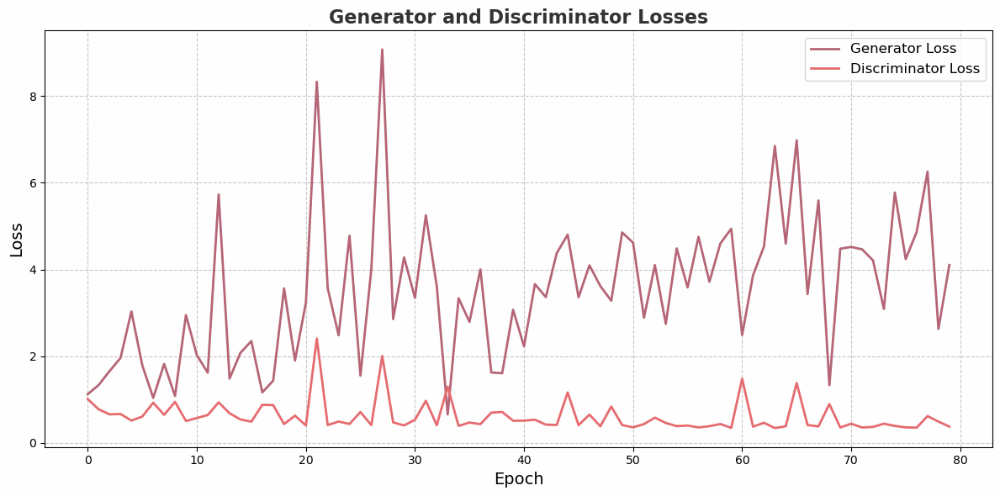

In [13]:
def plot_losses(history):
    # Assuming that the history object has keys for the generator and discriminator losses
    generator_losses = history.history['gen_loss']  # Adjust according to your history keys
    discriminator_losses = history.history['disc_loss']  # Adjust according to your history keys
    plt.figure(figsize=(12, 6))
    plt.plot(generator_losses, label='Generator Loss', color='#b56576', linewidth=2)
    plt.plot(discriminator_losses, label='Discriminator Loss', color='#e56b6f', linewidth=2)
    # Adding aesthetics
    plt.title('Generator and Discriminator Losses', fontsize=16, fontweight='bold', color='#333333')
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.gcf().set_facecolor('#fefefe')  # Set figure background color
    plt.gca().set_facecolor('#fefefe')  # Set axes background color
    plt.tight_layout()  # Adjust layout to prevent clipping
    plt.show()

# After training, call the plot function
plot_losses(history)

Folder: .ipynb_checkpoints
 - arun.test-checkpoint.ipynb
Folder: AI - CET 313( new Set)-20250122T082533Z-001.zip
Folder: AI week 3 Task .ipynb
Folder: AI Week 4 Task .ipynb
Folder: Anaconda3-2024.10-1-Windows-x86_64.exe
Folder: archive
 - images
Folder: archive.zip
Folder: arun.test.ipynb
Folder: desktop.ini
Folder: generated
Folder: generated_image_epoch_1.png
Folder: generated_image_epoch_10.png
Folder: generated_image_epoch_11.png
Folder: generated_image_epoch_12.png
Folder: generated_image_epoch_13.png
Folder: generated_image_epoch_14.png
Folder: generated_image_epoch_15.png
Folder: generated_image_epoch_16.png
Folder: generated_image_epoch_17.png
Folder: generated_image_epoch_18.png
Folder: generated_image_epoch_19.png
Folder: generated_image_epoch_2.png
Folder: generated_image_epoch_20.png
Folder: generated_image_epoch_21.png
Folder: generated_image_epoch_22.png
Folder: generated_image_epoch_23.png
Folder: generated_image_epoch_24.png
Folder: generated_image_epoch_25.png
Folder: 

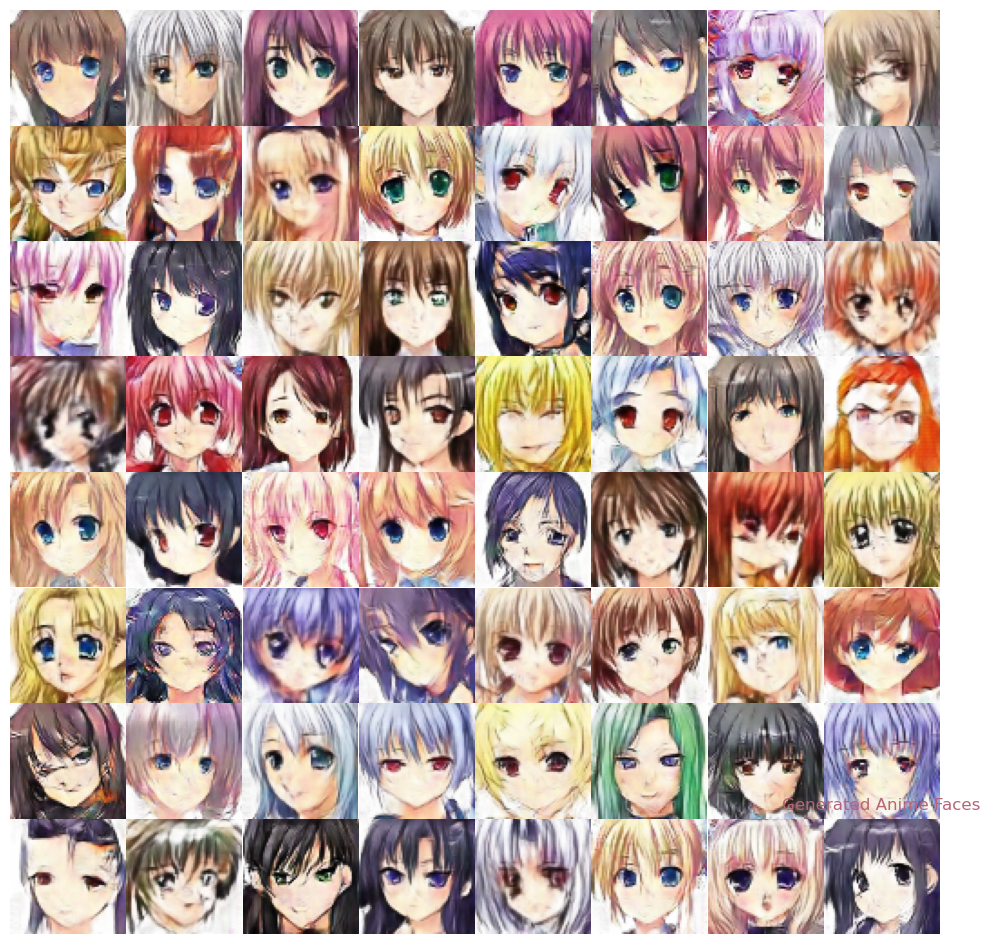

In [14]:
input_dir = "./"
for folder in os.listdir(input_dir):
    print(f"Folder: {folder}")
    folder_path = os.path.join(input_dir, folder)
    if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
            print(f" - {file}")
# Load model weights
weights_dir = "./archive/" 
try:
    dcgan.generator.load_weights(os.path.join(weights_dir, "generator_weights.h5"))
    dcgan.discriminator.load_weights(os.path.join(weights_dir, "discriminator_weights.h5"))
except FileNotFoundError as e:
    print(e)
def generate_faces():
    # Generate 64 images 
    noise = tf.random.normal([64, random_vector_size])  # Ensure using the correct random vector size
    generated_images = dcgan.generator(noise)
    fig = plt.figure(figsize=(12, 12))
    for i in range(generated_images.shape[0]):
        plt.subplot(8, 8, i + 1)
        # Convert to range [0,1] for plt.imshow()
        plt.imshow((generated_images[i, :, :, :] * 0.5 + 0.5))  # Rescale from [-1, 1] to [0, 1]
        plt.axis("off")
    plt.subplots_adjust(wspace=0, hspace=0)  # Adjust subplot spacing
    plt.title('Generated Anime Faces', fontsize=12, color='#b56576')  # Title with specified color
    plt.show()
generate_faces()

In [15]:
# Import necessary libraries
from torch.utils.data import Dataset, DataLoader  # Import Dataset and DataLoader for handling datasets
from PIL import Image  # PIL (Python Imaging Library) for image loading and processing

# Path to the image dataset directory
DATA = './archive/images'

# Check if the dataset directory exists; if not, raise an error
if not os.path.exists(DATA):
    raise FileNotFoundError(f"Data directory not found at {DATA}")

# Image size for resizing and cropping
image_size = 64

# Batch size for loading data in chunks during training
batch_size = 128

# Mean and standard deviation values for normalizing images (common for pre-trained models)
# These values are set to (0.5, 0.5, 0.5) for each channel (RGB), common for datasets like CelebA.
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

# Custom Dataset class for loading images
class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Initializes the dataset. Loads image paths from the directory and applies transformations.
        :param root_dir: Directory containing images.
        :param transform: Optional transformation to apply to the images.
        """
        self.root_dir = root_dir  # Directory where images are stored
        self.transform = transform  # Optional image transformation
        # List of image file paths (only jpg, png, and jpeg are included)
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith(('jpg', 'png', 'jpeg'))]

    def __len__(self):
        """Returns the total number of images in the dataset."""
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Loads and returns an image at the given index, applying any transformations if provided.
        :param idx: Index of the image to load.
        :return: Transformed image (Tensor format)
        """
        img_path = self.image_paths[idx]  # Get the image file path
        image = Image.open(img_path).convert("RGB")  # Open the image and convert it to RGB mode
        if self.transform:
            image = self.transform(image)  # Apply the transformations to the image (if any)
        return image  # Return the transformed image

# Create an instance of the CustomImageDataset for training
train_ds = CustomImageDataset(DATA, transform=T.Compose([
    T.Resize(image_size),  # Resize images to the specified size
    T.CenterCrop(image_size),  # Crop the center of the image to ensure a square shape
    T.ToTensor(),  # Convert the image to a PyTorch tensor
    T.Normalize(*stats)  # Normalize the image with mean and std dev for each channel
]))

# Optionally, a DataLoader can be created for batching and shuffling the dataset during training
# train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)  # Uncomment if needed


In [16]:
# Function to get the default device (CUDA if available, otherwise CPU)
def get_default_device():
    """
    This function returns the default device (GPU if available, otherwise CPU) 
    to be used for PyTorch tensors and models. It checks if CUDA is available 
    and returns the appropriate device.
    
    :return: device (torch.device) - The device to run the model on.
    """
    return torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Return 'cuda' if GPU is available, otherwise 'cpu'


In [17]:
# Determine the device to use (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Create a DataLoader to load the dataset in batches, shuffle for randomness
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)

# Function to denormalize the tensor values (scale back to the original image range [0, 1])
def denorm(x):
    """
    This function denormalizes the input tensor 'x', scaling the values back 
    to the [0, 1] range. It assumes that the tensor has been normalized 
    previously using the formula (x - mean) / std.
    
    :param x: Tensor to denormalize.
    :return: Denormalized tensor.
    """
    return x * 0.5 + 0.5  # Rescale tensor back from [-1, 1] to [0, 1] by reversing normalization

# Function to move data (e.g., tensor or list/tuple of tensors) to the specified device (CPU or GPU)
def to_device(data, device):
    """
    Moves tensor(s) to the specified device (CPU or GPU).
    If the input is a list or tuple, it recursively moves each element to the device.
    
    :param data: Input data (tensor, list, or tuple of tensors).
    :param device: The target device (e.g., 'cpu' or 'cuda').
    :return: Data moved to the specified device.
    """
    if isinstance(data, (list, tuple)):
        # If data is a list or tuple, apply the to_device function recursively
        return [to_device(x, device) for x in data]
    return data.to(device)  # Move tensor to the specified device

# Determine the device to use (again, repeated from earlier, but this is the final call to set device)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


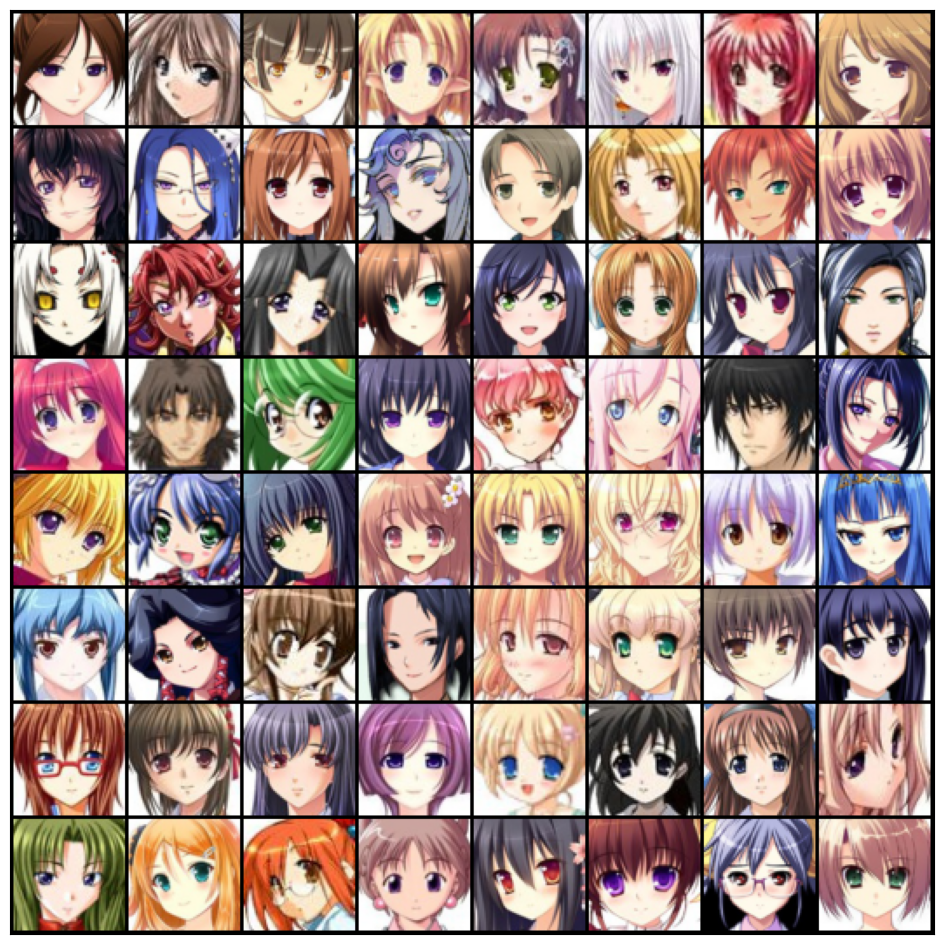

In [18]:
# Function to denormalize the image tensors (scaling them back to the original range)
def denorm(img_tensors):
    """
    This function denormalizes the input image tensors by reversing the normalization process.
    It rescales the tensor values from the normalized range back to the original range, 
    using the mean and standard deviation values that were used for normalization.
    
    :param img_tensors: A tensor representing a batch of images, typically in normalized form.
    :return: Denormalized tensor (scaled back to the original image range).
    """
    return img_tensors * stats[1][0] + stats[0][0]  # Apply denormalization using the stored stats (mean, std)

# Function to display a batch of images in a grid
def show_images(images, nmax=64):
    """
    Displays a batch of images as a grid. The images are denormalized first and then displayed.
    
    :param images: A tensor representing a batch of images.
    :param nmax: Maximum number of images to display from the batch (default is 64).
    """
    fig, ax = plt.subplots(figsize=(12, 12))  # Create a plot with a larger figure size for better visibility
    ax.set_xticks([]); ax.set_yticks([])  # Hide the axis ticks
    # Create a grid of images and show the denormalized images
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

# Function to show a batch of images from a DataLoader
def show_batch(dl, nmax=64):
    """
    Shows a single batch of images from a DataLoader, displaying them using the `show_images` function.
    
    :param dl: The DataLoader providing batches of images.
    :param nmax: Maximum number of images to display from the batch (default is 64).
    """
    for batch in dl:
        show_images(batch, nmax)  # Show images from the batch
        break  # Only display the first batch and stop

# Call the function to show a batch of images from the training DataLoader
show_batch(train_dl)


In [19]:
# Import necessary libraries
import matplotlib.pyplot as plt  # For plotting images
import torchvision.utils as vutils  # For utility functions like make_grid to create image grids

def show_images(images, nrow=8):
    """
    Displays a batch of images in a grid format.
    
    :param images: A tensor representing a batch of images (usually with shape [batch_size, channels, height, width]).
    :param nrow: Number of images to display in each row of the grid (default is 8).
    """
    # Detach the images from the computation graph and move them to CPU (if they are on GPU)
    images = images.detach().cpu()

    # Create a grid of images using make_grid function from torchvision, normalizing pixel values to [0, 1]
    grid = vutils.make_grid(images, nrow=nrow, normalize=True)

    # Create a figure with the specified size
    plt.figure(figsize=(12, 18))

    # Display the grid of images. 'permute(1, 2, 0)' changes the shape from [C, H, W] to [H, W, C] for displaying with matplotlib
    plt.imshow(grid.permute(1, 2, 0)) 

    # Hide the axis ticks for a cleaner image display
    plt.axis('off')

    # Show the plot
    plt.show()


In [20]:
class DeviceDataLoader:
    """
    A class to wrap a DataLoader and automatically move data to a specified device (CPU or GPU).
    This ensures that each batch of data is moved to the correct device before being used in model training or evaluation.
    """
    def __init__(self, dl, device):
        """
        Initialize the DeviceDataLoader with the given DataLoader and target device.
        
        :param dl: The DataLoader instance to wrap.
        :param device: The device (CPU or GPU) to move the data to.
        """
        self.dl = dl  # The DataLoader to wrap
        self.device = device  # The device (either 'cpu' or 'cuda') to move the data to
        
    def __iter__(self):
        """
        Iterate through the DataLoader, moving each batch of data to the specified device.
        
        :return: A batch of data moved to the device.
        """
        for b in self.dl:  # Iterate through each batch in the DataLoader
            yield to_device(b, self.device)  # Move the batch to the specified device and yield it

    def __len__(self):
        """
        Return the number of batches in the DataLoader.
        
        :return: The length of the DataLoader (number of batches).
        """
        return len(self.dl)  # Return the number of batches in the DataLoader

# Get the default device (either 'cpu' or 'cuda')
device = get_default_device()

# Wrap the train_dl DataLoader to move batches of data to the correct device (GPU or CPU)
train_dl = DeviceDataLoader(train_dl, device)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9998193..0.99991894].


Saving generatedimages-0000.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/70], loss_g: 6.9221, loss_d: 1.2280, real_score: 0.9650, fake_score: 0.6564
Saving generatedimages-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/70], loss_g: 5.5613, loss_d: 0.8061, real_score: 0.5540, fake_score: 0.0052
Saving generatedimages-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/70], loss_g: 7.0525, loss_d: 0.4554, real_score: 0.9529, fake_score: 0.3033
Saving generatedimages-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/70], loss_g: 7.9099, loss_d: 0.3953, real_score: 0.9578, fake_score: 0.2696
Saving generatedimages-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/70], loss_g: 5.7706, loss_d: 0.1798, real_score: 0.9590, fake_score: 0.1229
Saving generatedimages-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/70], loss_g: 4.0974, loss_d: 0.0437, real_score: 0.9701, fake_score: 0.0063
Saving generatedimages-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/70], loss_g: 6.4103, loss_d: 0.1069, real_score: 0.9305, fake_score: 0.0120
Saving generatedimages-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/70], loss_g: 5.0187, loss_d: 0.2796, real_score: 0.8460, fake_score: 0.0725
Saving generatedimages-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/70], loss_g: 3.3790, loss_d: 0.1694, real_score: 0.8942, fake_score: 0.0314
Saving generatedimages-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/70], loss_g: 6.0570, loss_d: 0.1088, real_score: 0.9344, fake_score: 0.0329
Saving generatedimages-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/70], loss_g: 7.0137, loss_d: 0.0411, real_score: 0.9786, fake_score: 0.0179
Saving generatedimages-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/70], loss_g: 5.2144, loss_d: 0.3060, real_score: 0.7914, fake_score: 0.0101
Saving generatedimages-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/70], loss_g: 3.4514, loss_d: 0.1685, real_score: 0.9018, fake_score: 0.0460
Saving generatedimages-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/70], loss_g: 4.5658, loss_d: 0.1680, real_score: 0.9081, fake_score: 0.0530
Saving generatedimages-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/70], loss_g: 4.9815, loss_d: 0.1565, real_score: 0.9724, fake_score: 0.1072
Saving generatedimages-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/70], loss_g: 5.1977, loss_d: 0.1603, real_score: 0.9654, fake_score: 0.1059
Saving generatedimages-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/70], loss_g: 2.0855, loss_d: 0.4865, real_score: 0.6770, fake_score: 0.0022
Saving generatedimages-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/70], loss_g: 4.4267, loss_d: 0.1779, real_score: 0.9095, fake_score: 0.0660
Saving generatedimages-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/70], loss_g: 3.8980, loss_d: 0.0871, real_score: 0.9591, fake_score: 0.0354
Saving generatedimages-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/70], loss_g: 6.6172, loss_d: 0.3260, real_score: 0.9637, fake_score: 0.2125
Saving generatedimages-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/70], loss_g: 4.9965, loss_d: 0.4159, real_score: 0.9059, fake_score: 0.2280
Saving generatedimages-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/70], loss_g: 1.7588, loss_d: 0.9775, real_score: 0.4876, fake_score: 0.0012
Saving generatedimages-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/70], loss_g: 0.9301, loss_d: 6.5488, real_score: 0.0029, fake_score: 0.0000
Saving generatedimages-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/70], loss_g: 3.7531, loss_d: 0.0953, real_score: 0.9766, fake_score: 0.0643
Saving generatedimages-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/70], loss_g: 4.5576, loss_d: 0.1010, real_score: 0.9807, fake_score: 0.0716
Saving generatedimages-0025.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/70], loss_g: 4.1372, loss_d: 0.0558, real_score: 0.9769, fake_score: 0.0307
Saving generatedimages-0026.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/70], loss_g: 5.0531, loss_d: 0.1051, real_score: 0.9739, fake_score: 0.0693
Saving generatedimages-0027.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/70], loss_g: 4.0433, loss_d: 0.4038, real_score: 0.9214, fake_score: 0.2024
Saving generatedimages-0028.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/70], loss_g: 5.0371, loss_d: 0.0458, real_score: 0.9792, fake_score: 0.0234
Saving generatedimages-0029.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/70], loss_g: 4.2253, loss_d: 0.0560, real_score: 0.9688, fake_score: 0.0201
Saving generatedimages-0030.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/70], loss_g: 2.3763, loss_d: 0.1232, real_score: 0.9216, fake_score: 0.0284
Saving generatedimages-0031.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/70], loss_g: 4.1985, loss_d: 0.0742, real_score: 0.9696, fake_score: 0.0398
Saving generatedimages-0032.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/70], loss_g: 9.3543, loss_d: 4.6549, real_score: 0.9998, fake_score: 0.9699
Saving generatedimages-0033.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/70], loss_g: 4.8345, loss_d: 0.0451, real_score: 0.9815, fake_score: 0.0250
Saving generatedimages-0034.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/70], loss_g: 5.8973, loss_d: 0.4566, real_score: 0.9820, fake_score: 0.3063
Saving generatedimages-0035.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/70], loss_g: 3.9405, loss_d: 0.0725, real_score: 0.9606, fake_score: 0.0290
Saving generatedimages-0036.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/70], loss_g: 2.7479, loss_d: 0.1188, real_score: 0.9027, fake_score: 0.0070
Saving generatedimages-0037.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/70], loss_g: 4.0430, loss_d: 0.1019, real_score: 0.9227, fake_score: 0.0106
Saving generatedimages-0038.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/70], loss_g: 5.7600, loss_d: 0.2434, real_score: 0.9325, fake_score: 0.1286
Saving generatedimages-0039.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/70], loss_g: 7.2295, loss_d: 0.2958, real_score: 0.9880, fake_score: 0.2128
Saving generatedimages-0040.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [41/70], loss_g: 4.6635, loss_d: 0.0778, real_score: 0.9791, fake_score: 0.0512
Saving generatedimages-0041.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [42/70], loss_g: 5.5469, loss_d: 0.0549, real_score: 0.9857, fake_score: 0.0362
Saving generatedimages-0042.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [43/70], loss_g: 9.9487, loss_d: 1.4091, real_score: 0.9998, fake_score: 0.6331
Saving generatedimages-0043.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [44/70], loss_g: 4.6114, loss_d: 0.0657, real_score: 0.9717, fake_score: 0.0336
Saving generatedimages-0044.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [45/70], loss_g: 5.3535, loss_d: 0.0503, real_score: 0.9915, fake_score: 0.0390
Saving generatedimages-0045.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [46/70], loss_g: 4.7508, loss_d: 0.0572, real_score: 0.9613, fake_score: 0.0152
Saving generatedimages-0046.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [47/70], loss_g: 4.6460, loss_d: 0.0723, real_score: 0.9775, fake_score: 0.0399
Saving generatedimages-0047.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [48/70], loss_g: 8.5093, loss_d: 1.2444, real_score: 0.9998, fake_score: 0.5792
Saving generatedimages-0048.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [49/70], loss_g: 5.7341, loss_d: 0.0560, real_score: 0.9751, fake_score: 0.0281
Saving generatedimages-0049.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [50/70], loss_g: 7.2630, loss_d: 0.0857, real_score: 0.9963, fake_score: 0.0735
Saving generatedimages-0050.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [51/70], loss_g: 5.1155, loss_d: 0.0809, real_score: 0.9643, fake_score: 0.0378
Saving generatedimages-0051.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [52/70], loss_g: 0.1229, loss_d: 2.2854, real_score: 0.2005, fake_score: 0.0001
Saving generatedimages-0052.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [53/70], loss_g: 5.4474, loss_d: 0.2372, real_score: 0.9402, fake_score: 0.1248
Saving generatedimages-0053.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [54/70], loss_g: 4.1700, loss_d: 0.1844, real_score: 0.8867, fake_score: 0.0324
Saving generatedimages-0054.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [55/70], loss_g: 4.9130, loss_d: 0.0608, real_score: 0.9872, fake_score: 0.0438
Saving generatedimages-0055.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [56/70], loss_g: 4.8869, loss_d: 0.0312, real_score: 0.9788, fake_score: 0.0091
Saving generatedimages-0056.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [57/70], loss_g: 5.6671, loss_d: 0.0732, real_score: 0.9857, fake_score: 0.0499
Saving generatedimages-0057.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [58/70], loss_g: 4.2518, loss_d: 0.0999, real_score: 0.9240, fake_score: 0.0073
Saving generatedimages-0058.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [59/70], loss_g: 4.7477, loss_d: 0.0376, real_score: 0.9836, fake_score: 0.0176
Saving generatedimages-0059.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [60/70], loss_g: 3.5643, loss_d: 0.4570, real_score: 0.8127, fake_score: 0.1428
Saving generatedimages-0060.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [61/70], loss_g: 5.2814, loss_d: 0.0292, real_score: 0.9857, fake_score: 0.0140
Saving generatedimages-0061.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [62/70], loss_g: 4.6956, loss_d: 1.4902, real_score: 0.9792, fake_score: 0.6015
Saving generatedimages-0062.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [63/70], loss_g: 5.0103, loss_d: 0.0457, real_score: 0.9834, fake_score: 0.0264
Saving generatedimages-0063.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [64/70], loss_g: 2.5271, loss_d: 0.3923, real_score: 0.7869, fake_score: 0.0717
Saving generatedimages-0064.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [65/70], loss_g: 6.1361, loss_d: 0.0676, real_score: 0.9758, fake_score: 0.0386
Saving generatedimages-0065.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [66/70], loss_g: 5.3785, loss_d: 0.0452, real_score: 0.9930, fake_score: 0.0346
Saving generatedimages-0066.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [67/70], loss_g: 6.2836, loss_d: 0.0415, real_score: 0.9987, fake_score: 0.0358
Saving generatedimages-0067.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [68/70], loss_g: 5.9318, loss_d: 0.0362, real_score: 0.9812, fake_score: 0.0159
Saving generatedimages-0068.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [69/70], loss_g: 6.5018, loss_d: 0.0917, real_score: 0.9277, fake_score: 0.0052
Saving generatedimages-0069.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [70/70], loss_g: 6.6142, loss_d: 0.0759, real_score: 0.9938, fake_score: 0.0573
Saving generatedimages-0070.png


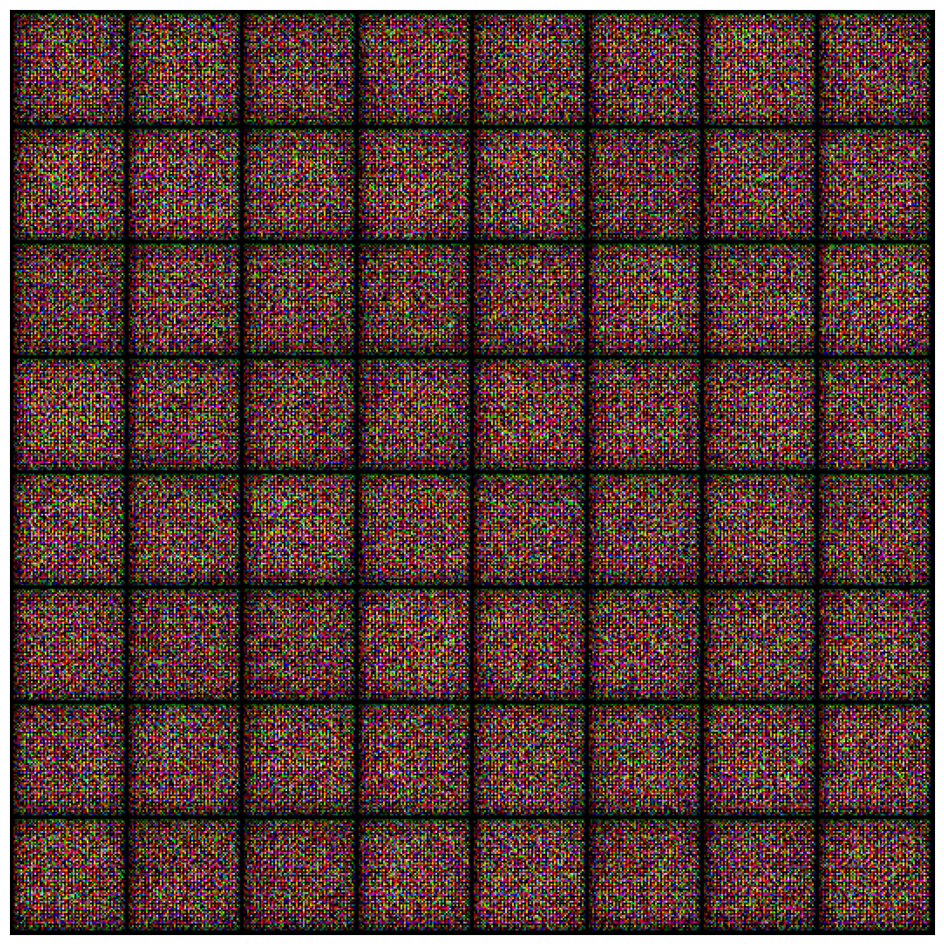

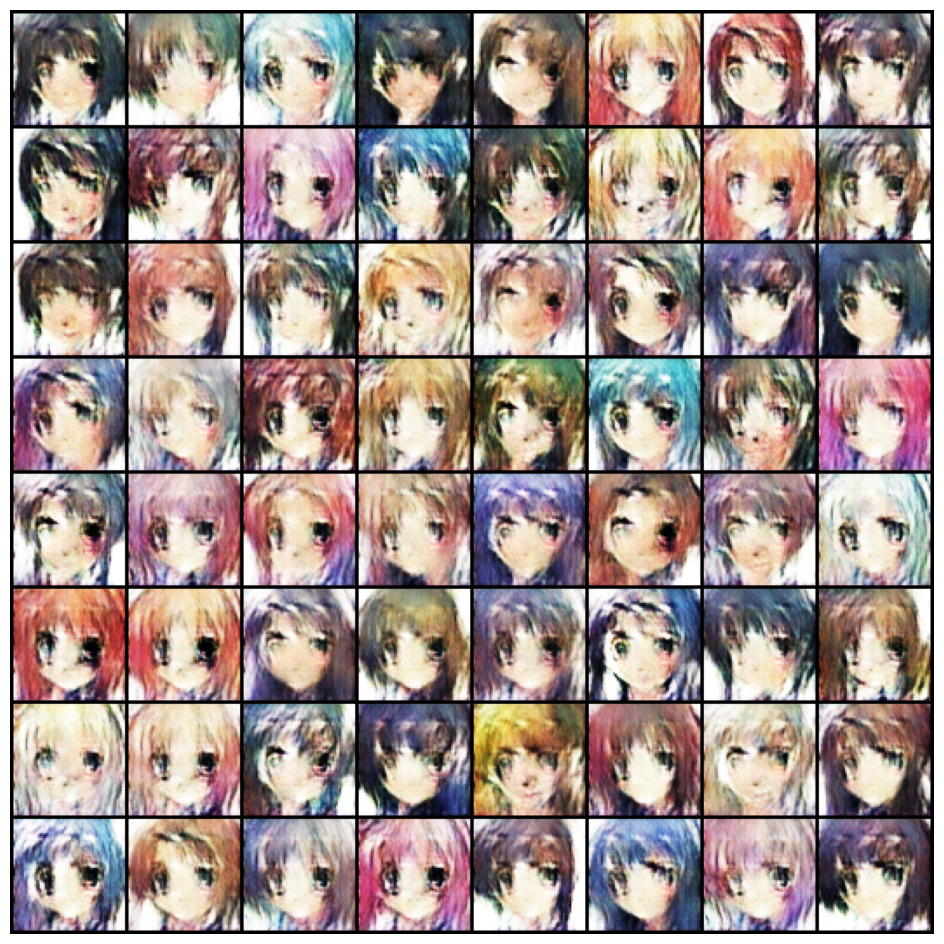

In [21]:
# Discriminator model: A Convolutional Neural Network (CNN) that classifies real vs fake images
discriminator = nn.Sequential(
    # First convolutional layer with BatchNorm and LeakyReLU activation
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),  # input: 3 channels (RGB), output: 64 channels
    nn.BatchNorm2d(64),  # Batch normalization to stabilize training
    nn.LeakyReLU(0.2, inplace=True),  # LeakyReLU activation for non-linearity

    # Second convolutional layer
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),

    # Third convolutional layer
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),

    # Fourth convolutional layer
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),

    # Final convolutional layer to output a single prediction (real or fake)
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    nn.Flatten(),  # Flatten output to a single vector
    nn.Sigmoid()  # Sigmoid function to output a value between 0 and 1 (real or fake)
)

# Move discriminator to the specified device (CPU or GPU)
discriminator = to_device(discriminator, device)

# Latent size for the generator's input noise vector
latent_size = 128

# Generator model: A network that generates fake images from random noise
generator = nn.Sequential(
    # First transposed convolution layer to increase image size
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),  # latent_size -> 512 channels
    nn.BatchNorm2d(512),
    nn.ReLU(True),

    # Second transposed convolution layer
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    # Third transposed convolution layer
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),

    # Fourth transposed convolution layer
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    # Final layer to output an image with 3 channels (RGB)
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()  # Tanh activation to output pixel values between -1 and 1
)

# Move generator to the specified device (CPU or GPU)
generator = to_device(generator, device)

# Function to train the discriminator (real vs fake classification)
def train_discriminator(real_images, optimizer_d):
    optimizer_d.zero_grad()  # Zero the gradients for the discriminator
    real_predictions = discriminator(real_images)  # Get discriminator's prediction on real images
    real_targets = torch.ones(real_images.size(0), 1, device=device)  # Real target labels (1)
    real_loss = F.binary_cross_entropy(real_predictions, real_targets)  # Binary cross-entropy loss for real images
    real_score = torch.mean(real_predictions).item()  # Mean of real predictions as a score

    # Generate fake images using the generator
    latent_vectors = torch.randn(batch_size, latent_size, 1, 1, device=device)  # Random latent vectors
    generated_images = generator(latent_vectors)  # Generate fake images from latent vectors
    fake_targets = torch.zeros(generated_images.size(0), 1, device=device)  # Fake target labels (0)
    fake_predictions = discriminator(generated_images)  # Get discriminator's prediction on fake images
    fake_loss = F.binary_cross_entropy(fake_predictions, fake_targets)  # Binary cross-entropy loss for fake images
    fake_score = torch.mean(fake_predictions).item()  # Mean of fake predictions as a score

    # Total discriminator loss (sum of real and fake losses)
    total_loss = real_loss + fake_loss
    total_loss.backward()  # Backpropagate the total loss
    optimizer_d.step()  # Update discriminator's parameters
    return total_loss.item(), real_score, fake_score  # Return the loss and scores

# Function to train the generator (fake images that fool the discriminator)
def train_generator(optimizer_g):
    optimizer_g.zero_grad()  # Zero the gradients for the generator
    latent_vectors = torch.randn(batch_size, latent_size, 1, 1, device=device)  # Random latent vectors
    generated_images = generator(latent_vectors)  # Generate fake images
    predictions = discriminator(generated_images)  # Get discriminator's prediction on fake images
    targets = torch.ones(batch_size, 1, device=device)  # Target labels as real (1) for generator's loss
    loss = F.binary_cross_entropy(predictions, targets)  # Binary cross-entropy loss for generator
    loss.backward()  # Backpropagate the loss
    optimizer_g.step()  # Update generator's parameters
    return loss.item()  # Return the loss

# Function to save generated images to a directory
def save_generated_samples(index, latent_tensors, display=True):
    fake_images = generator(latent_tensors)  # Generate fake images
    file_name = f'generatedimages-{index:04d}.png'  # Create a filename
    save_image(denorm(fake_images), os.path.join(sample_directory, file_name), nrow=8)  # Save the image
    print('Saving', file_name)
    
    if display:
        # Display the generated images
        fig, ax = plt.subplots(figsize=(12, 12))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))  # Arrange images in a grid

# Create directory to store generated images
sample_directory = 'generated'
os.makedirs(sample_directory, exist_ok=True)

# Generate and save some initial fake images
fixed_latent_vectors = torch.randn(64, latent_size, 1, 1, device=device)
save_generated_samples(0, fixed_latent_vectors)

# Function to fit the model (train the discriminator and generator)
def fit_model(epochs, learning_rate, start_epoch=1):
    torch.cuda.empty_cache()  # Empty the GPU cache before starting training
    losses_g = []  # Store generator losses
    losses_d = []  # Store discriminator losses
    real_scores = []  # Store real scores from discriminator
    fake_scores = []  # Store fake scores from discriminator

    # Adam optimizers for both discriminator and generator
    optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
    optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images in tqdm(train_dl):  # Loop over real images from the training data
            loss_d, real_score, fake_score = train_discriminator(real_images, optimizer_d)  # Train discriminator
            loss_g = train_generator(optimizer_g)  # Train generator
        
        # Save losses and scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Print progress for each epoch
        print(f"Epoch [{epoch + 1}/{epochs}], loss_g: {loss_g:.4f}, loss_d: {loss_d:.4f}, real_score: {real_score:.4f}, fake_score: {fake_score:.4f}")
        save_generated_samples(epoch + start_epoch, fixed_latent_vectors, display=False)

    return losses_g, losses_d, real_scores, fake_scores

# Training parameters
learning_rate = 0.0002
epochs = 70

# Train the model and save history
history = fit_model(epochs, learning_rate)

# Save the trained generator and discriminator models
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

# Load and display a generated image
img = mpimg.imread('./generated/generatedimages-0005.png')
plt.figure(figsize=(12, 12))
plt.imshow(img)
plt.axis('off')  # Remove axis for display purposes
plt.show()


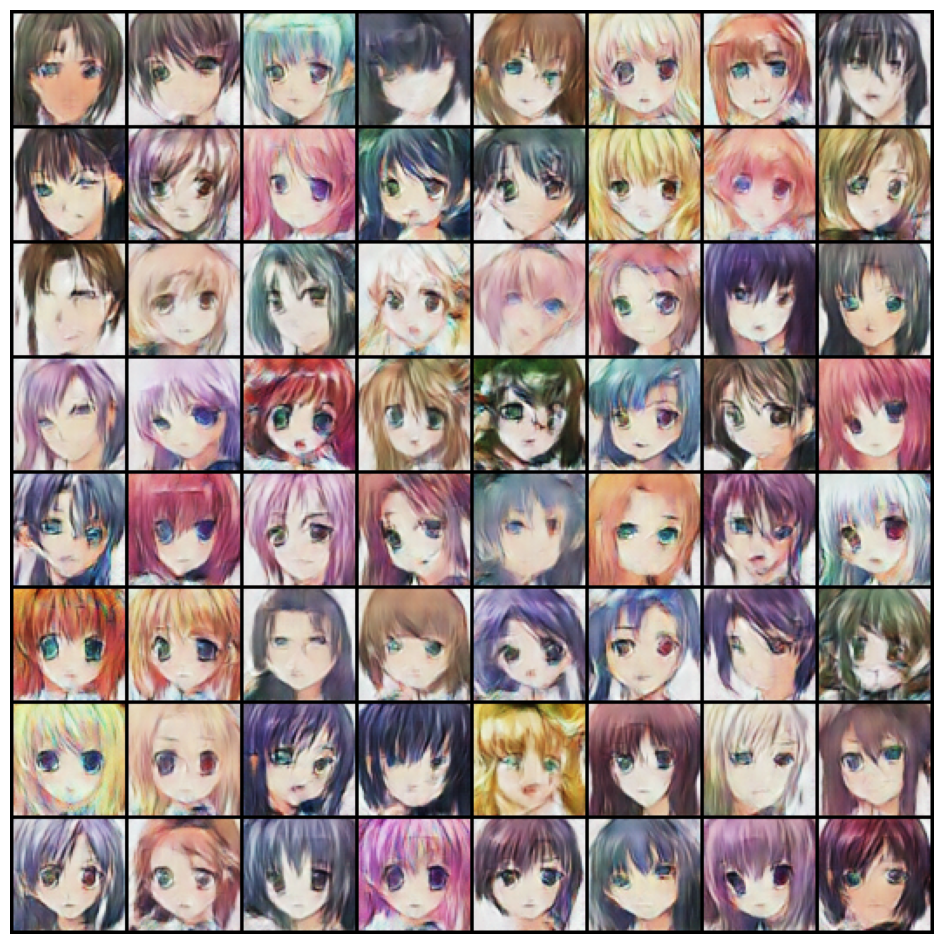

In [22]:
# Import the matplotlib image module for reading image files
import matplotlib.image as mpimg

# Read the image from the specified file path
img = mpimg.imread('./generated/generatedimages-0015.png')

# Create a new figure with a specified size (12 inches by 12 inches)
plt.figure(figsize=(12, 12))

# Display the image using imshow. The image is passed to plt.imshow for rendering.
plt.imshow(img)

# Turn off the axis labels and ticks for a cleaner display of the image
plt.axis('off')

# Show the image plot in a window
plt.show()


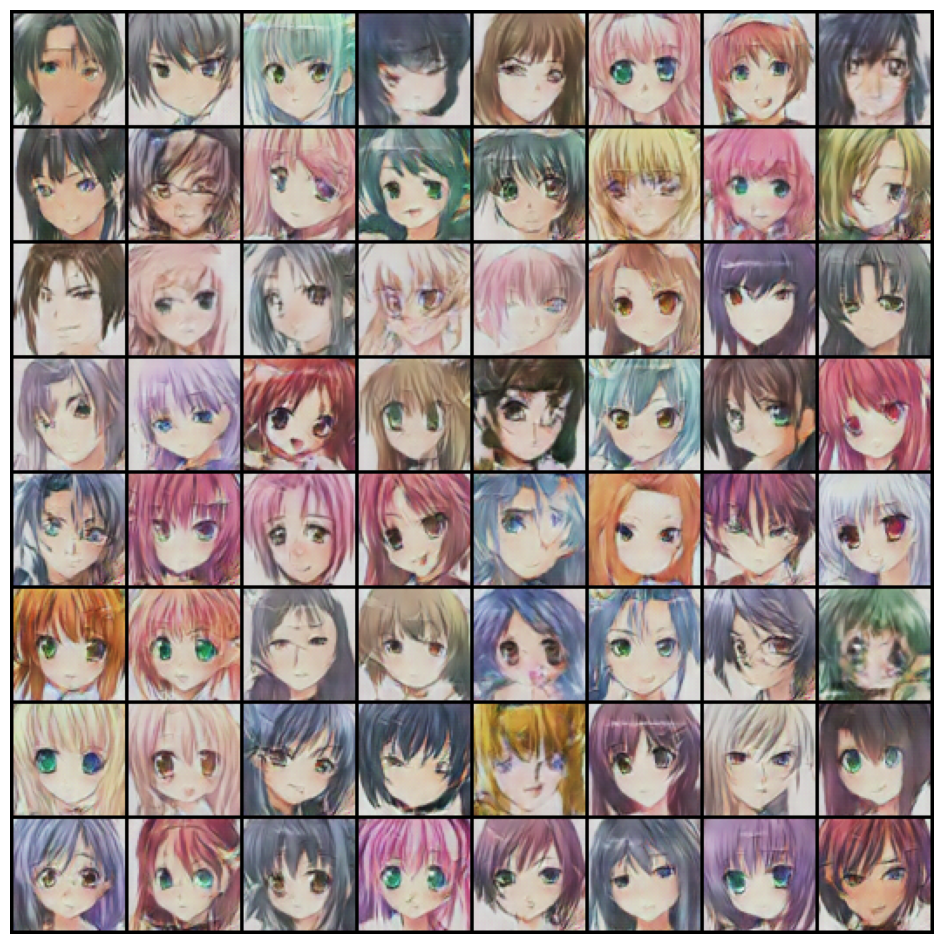

In [23]:
img = mpimg.imread('./generated/generatedimages-0035.png')
plt.figure(figsize=(12, 12)) 
plt.imshow(img)
plt.axis('off')
plt.show()

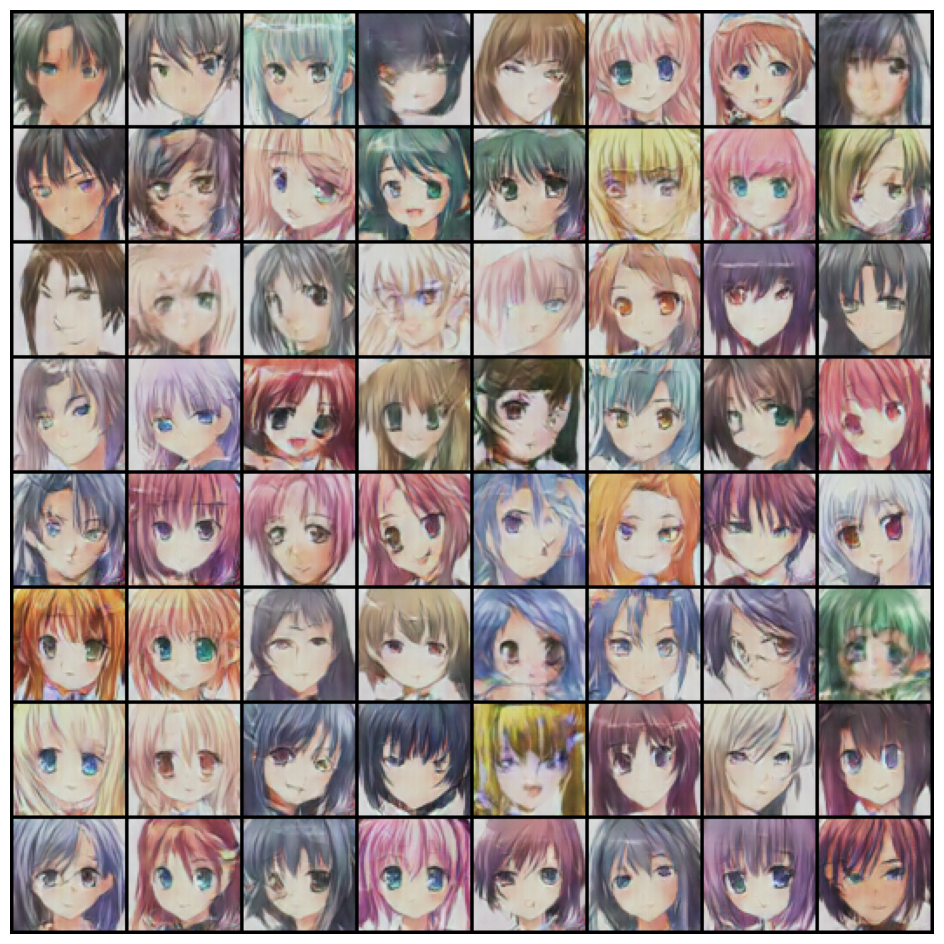

In [24]:
img = mpimg.imread('./generated/generatedimages-0040.png')
plt.figure(figsize=(12, 12)) 
plt.imshow(img)
plt.axis('off')
plt.show()

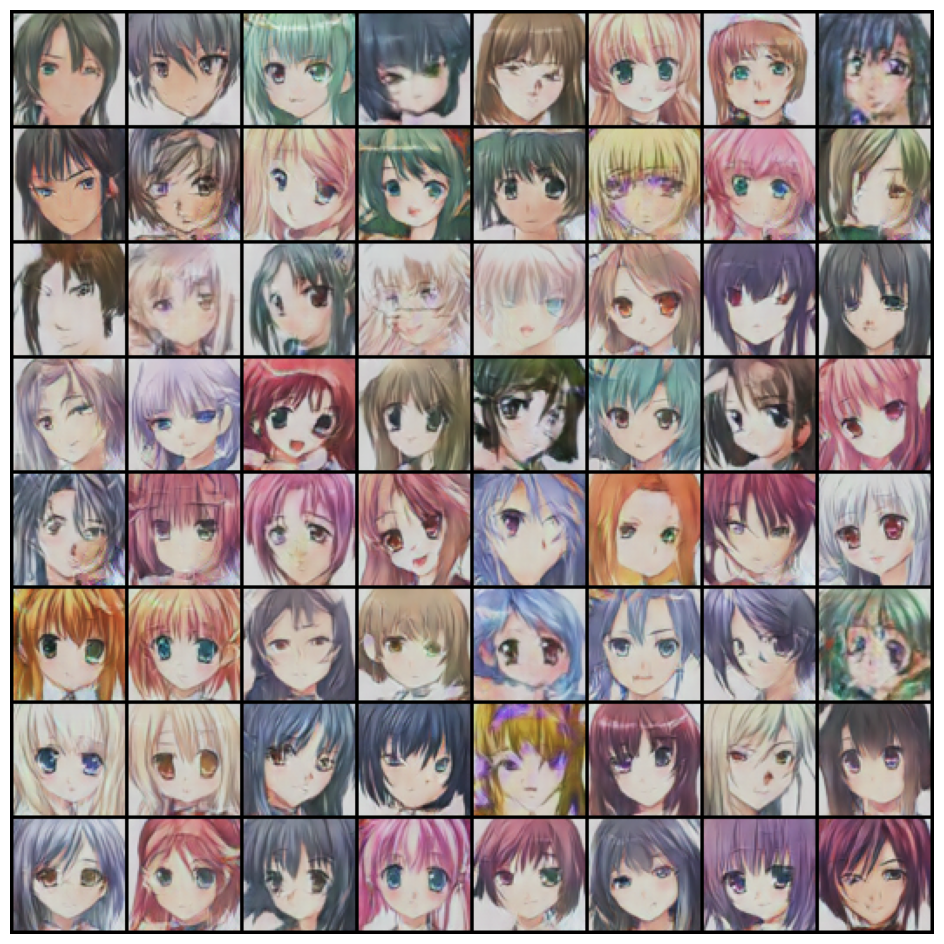

In [53]:
img = mpimg.imread('./generated/generatedimages-0070.png')
plt.figure(figsize=(12, 12)) 
plt.imshow(img)
plt.axis('off')
plt.show()

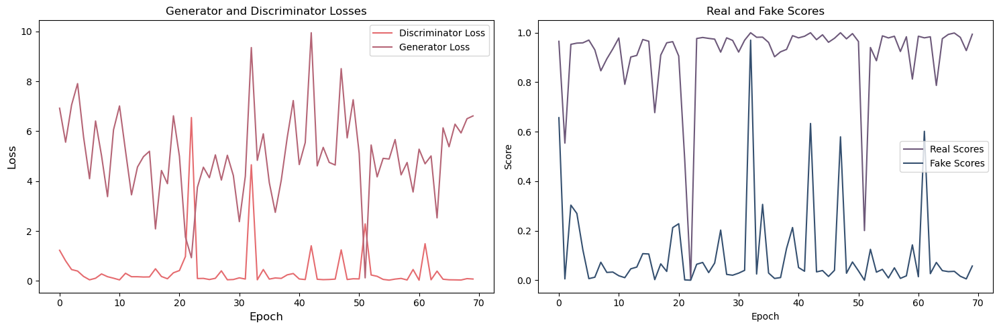

In [56]:
# Unpack history into separate lists for losses and scores
losses_g, losses_d, real_scores, fake_scores = history

# Create a figure with a size of 15x5 inches
plt.figure(figsize=(15, 5))

# Create the first subplot: loss curves for Generator and Discriminator
plt.subplot(1, 2, 1)  # This creates a grid of 1 row and 2 columns, and selects the first plot (left plot)
# Plot the Discriminator loss over epochs
plt.plot(losses_d, label='Discriminator Loss', color='#e56b6f')  
# Plot the Generator loss over epochs
plt.plot(losses_g, label='Generator Loss', color='#b56576') 
# Set the x-axis label (Epochs) with a font size of 12
plt.xlabel('Epoch', fontsize=12)
# Set the y-axis label (Loss) with a font size of 12
plt.ylabel('Loss', fontsize=12)
# Set the title of the plot
plt.title('Generator and Discriminator Losses')
# Add a legend to distinguish between the Generator and Discriminator loss curves
plt.legend()

# Create the second subplot: score curves for Real and Fake images
plt.subplot(1, 2, 2)  # This selects the second plot (right plot)
# Plot the real image scores over epochs
plt.plot(real_scores, label='Real Scores', color='#6d597a') 
# Plot the fake image scores over epochs
plt.plot(fake_scores, label='Fake Scores', color='#355070') 
# Set the x-axis label (Epochs)
plt.xlabel('Epoch')
# Set the y-axis label (Scores)
plt.ylabel('Score')
# Set the title of the plot
plt.title('Real and Fake Scores')
# Add a legend to distinguish between the real and fake scores
plt.legend()

# Adjust the layout so that there is no overlap between subplots
plt.tight_layout() 

# Display the figure with both subplots
plt.show()
